In [3]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

def load_data(filename):
    """
    Funzione per il parsing di una serie intraday 
    con estensione txt esportata da Tradestation
    """
    data = pd.read_csv(filename, 
                       usecols=['Date','Time','Open','High','Low','Close','Up','Down'], 
                       parse_dates=[['Date', 'Time']], )
    data.columns = ["date_time","open","high","low","close","up","down"]
    data.set_index('date_time', inplace = True)
    data['volume'] = data['up'] + data['down']
    data.drop(['up','down'], axis=1, inplace=True)
    return data

filename = "@GC_60min_Exchange.txt"
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset['body'] = round((dataset.close - dataset.open),2)
dataset.tail(23)

,open,high,low,close,volume,hour,body
date_time,,,,,,,
2019-11-08 06:00:00,1466.8,1468.2,1466.2,1467.4,7653,6,0.6
2019-11-08 07:00:00,1467.3,1467.5,1463.0,1463.1,16283,7,-4.2
2019-11-08 08:00:00,1463.0,1463.7,1457.0,1459.1,47698,8,-3.9
2019-11-08 09:00:00,1459.2,1462.7,1458.3,1460.7,36228,9,1.5
2019-11-08 10:00:00,1460.6,1468.0,1459.4,1466.8,42679,10,6.2
2019-11-08 11:00:00,1466.8,1469.3,1464.0,1467.8,62357,11,1.0
2019-11-08 12:00:00,1467.7,1469.2,1465.2,1465.8,23355,12,-1.9
2019-11-08 13:00:00,1465.7,1465.8,1461.4,1462.6,16203,13,-3.1
2019-11-08 14:00:00,1462.6,1464.6,1461.7,1463.7,10629,14,1.1


In [4]:
dataset.iplot(kind='candle',theme='white',
              up_color='green', down_color='red',
              title = "Gold Futures Continuous [GC]", xTitle = "Time", yTitle = "Price")

Filtriamo per esempio tutti i record alle ore 0 e visualizziamo i primi 10:

In [15]:
dataset[(dataset.hour == 0)].body.head(10)

date_time
2007-01-02    0.0
2007-01-03    0.0
2007-01-04   -0.3
2007-01-05   -0.4
2007-01-08   -0.1
2007-01-09   -0.8
2007-01-10   -0.4
2007-01-11    0.0
2007-01-12    1.2
2007-01-15    0.2
Name: body, dtype: float64

In [16]:
round(dataset[(dataset.hour == 0)].body.mean(),2)

0.02

In [17]:
dataset[(dataset.hour == 0)].body.count()

3311

In [18]:
round(dataset[(dataset.hour == 10)].body.mean(),2)

-0.23

In [19]:
dataset[(dataset.hour == 10)].body.count()

3312

La differenza non deve stupirci dal momento che durante l'anno ci sono molte sessioni incomplete dovute a festività!

In [20]:
hours = []

for hour in range(0,24):
    hours.append(hour)
    
print(hours)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [21]:
hour_bias = []

for hour in hours:
    hour_bias.append(round(dataset[(dataset.hour == hour)].body.mean(),2))

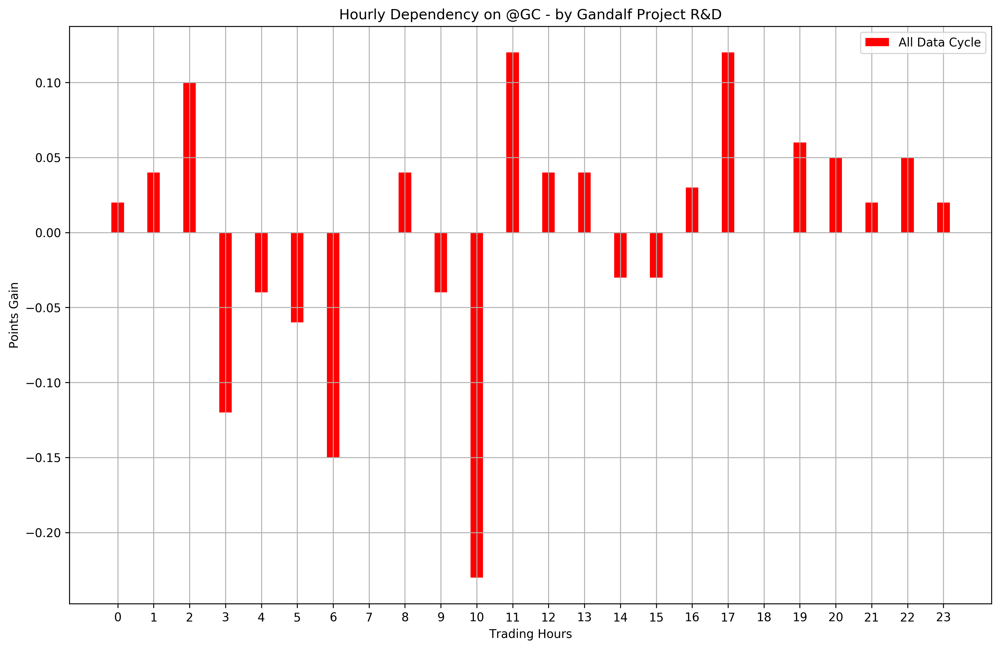

In [22]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 9), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                hour_bias, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
ax.set_ylabel('Points Gain')
ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

In [23]:
def normalizeMinMax(array):
    """
    Funzione per normalizzare un array
    che porta a 0 il valore minimo
    e ad 1 il valore massimo
    (a[i] - min(a))/(max(a)-min(a)) 
    """
    normalized_array = []
    for elements in array:
        normalized_array.append((elements - min(array))/(max(array)-min(array)))
    return normalized_array

def normalizeMax(array):
    """
    Funzione per normalizzare un array
    che porta ad 1 il valore massimo
    a[i]/max(a)
    """
    normalized_array = []
    for elements in array:
        normalized_array.append(elements / max(array))
    return normalized_array

def normalizeMaxMin(array):
    """
    Funzione per normalizzare un array
    che porta ad 1 il valore massimo
    a[i]/max(a) e a -1 il valore minimo a[i]/min(a)
    Funzione che lascia lo zero invariato!
    """
    normalized_array = []
    for element in array:
        if element > 0:
            normalized_array.append(element / max(array))
        else:
            normalized_array.append(-element / min(array))
    return normalized_array

In [24]:
normalize = True
    
if normalize == True:
    hour_bias = normalizeMaxMin(hour_bias)

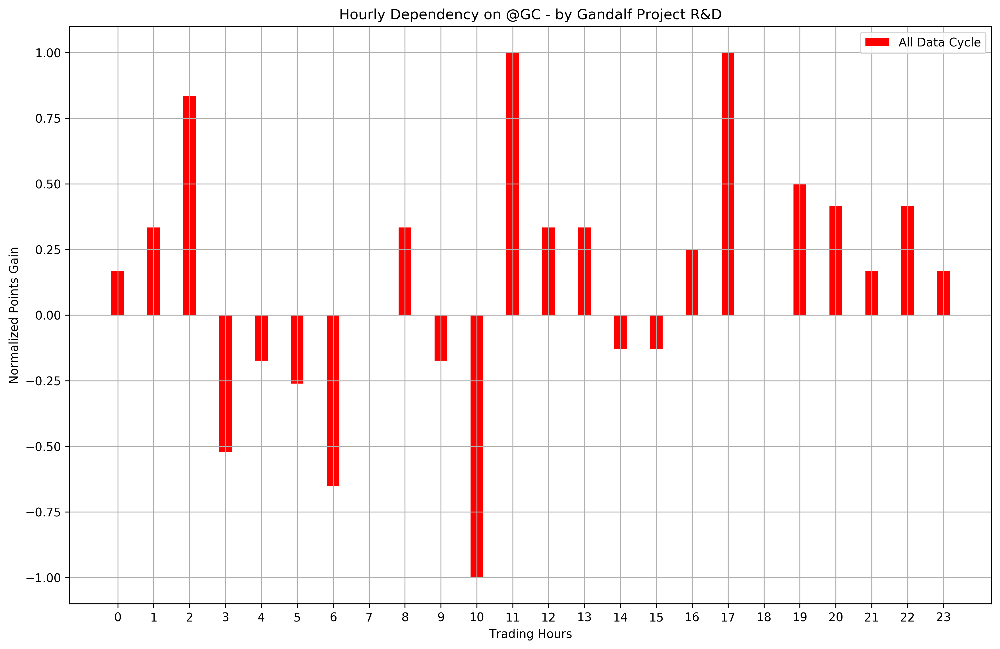

In [25]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 9), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                hour_bias, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Points Gain')
else:
    ax.set_ylabel('Points Gain')
ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))

ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

### Ripetendo l'analisi su tre periodi temporali differenti:

In [26]:
#******* INPUT *********************************

filename = "@GC_60min_Exchange.txt"

startDateLong = "20070101"
endDateLong = "20191015"

startDateMid = "20150101"
endDateMid = "20191015"

startDateShort = "20181015"
endDateShort = "20191015"

normalize = False

#******* INPUT *********************************

In [27]:
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset['body'] = round((dataset.close - dataset.open),2)
dataset.tail(23)

,open,high,low,close,volume,hour,body
date_time,,,,,,,
2019-11-08 06:00:00,1466.8,1468.2,1466.2,1467.4,7653,6,0.6
2019-11-08 07:00:00,1467.3,1467.5,1463.0,1463.1,16283,7,-4.2
2019-11-08 08:00:00,1463.0,1463.7,1457.0,1459.1,47698,8,-3.9
2019-11-08 09:00:00,1459.2,1462.7,1458.3,1460.7,36228,9,1.5
2019-11-08 10:00:00,1460.6,1468.0,1459.4,1466.8,42679,10,6.2
2019-11-08 11:00:00,1466.8,1469.3,1464.0,1467.8,62357,11,1.0
2019-11-08 12:00:00,1467.7,1469.2,1465.2,1465.8,23355,12,-1.9
2019-11-08 13:00:00,1465.7,1465.8,1461.4,1462.6,16203,13,-3.1
2019-11-08 14:00:00,1462.6,1464.6,1461.7,1463.7,10629,14,1.1


In [28]:
dataset.index.min()

Timestamp('2007-01-01 19:00:00')

In [29]:
dataset.index.max()

Timestamp('2019-11-11 05:00:00')

In [30]:
startDateLongParsed = datetime.date(int(startDateLong[0:4]), int(startDateLong[4:6]), int(startDateLong[6:]))
endDateLongParsed = datetime.date(int(endDateLong[0:4]), int(endDateLong[4:6]), int(endDateLong[6:]))

startDateMidParsed = datetime.date(int(startDateMid[0:4]), int(startDateMid[4:6]), int(startDateMid[6:]))
endDateMidParsed = datetime.date(int(endDateMid[0:4]), int(endDateMid[4:6]), int(endDateMid[6:]))

startDateShortParsed = datetime.date(int(startDateShort[0:4]), int(startDateShort[4:6]), int(startDateShort[6:]))
endDateShortParsed = datetime.date(int(endDateShort[0:4]), int(endDateShort[4:6]), int(endDateShort[6:]))

instrument_Long = dataset.loc[startDateLongParsed:endDateLongParsed]
instrument_Mid = dataset.loc[startDateMidParsed:endDateMidParsed]
instrument_Short = dataset.loc[startDateShortParsed:endDateShortParsed]

hour_bias_long = []
hour_bias_mid = []
hour_bias_short = []

hours = []
for hour in range(0,24):
    hours.append(hour)

for hour in hours:
    hour_bias_long.append(round(instrument_Long[(instrument_Long.hour == hour)].body.mean(),2))
    hour_bias_mid.append(round(instrument_Mid[(instrument_Mid.hour == hour)].body.mean(),2))
    hour_bias_short.append(round(instrument_Short[(instrument_Short.hour == hour)].body.mean(),2))
    
if normalize == True:
    hour_bias_long = normalizeMaxMin(hour_bias_long)
    hour_bias_mid = normalizeMaxMin(hour_bias_mid)
    hour_bias_short = normalizeMaxMin(hour_bias_short)

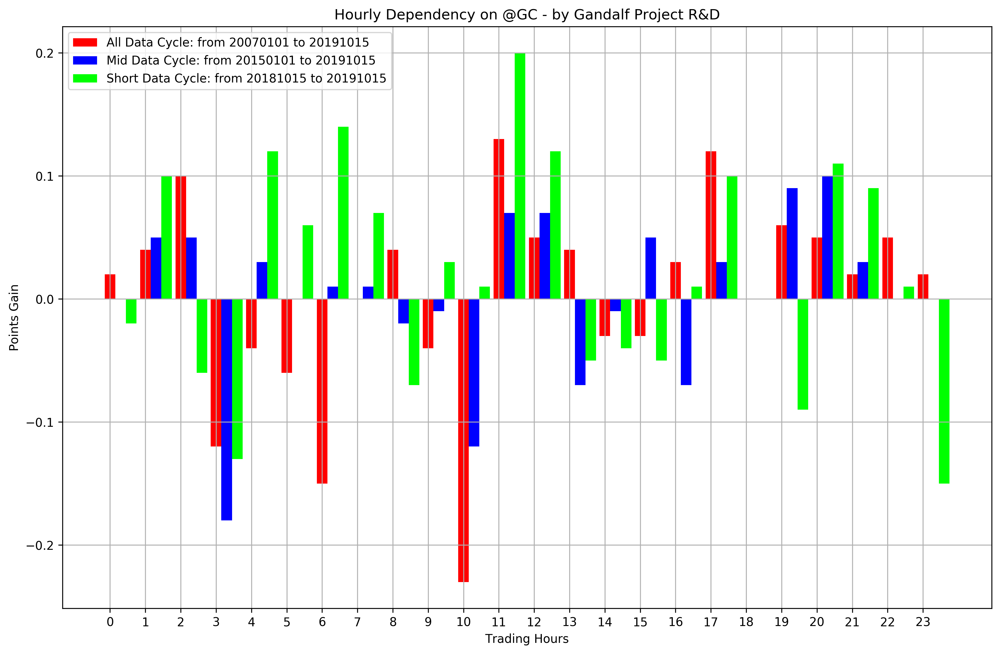

In [31]:
# MODULO GRAFICO **************************************
n_groups = 24
fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
index = np.arange(n_groups)
bar_width = 0.30
opacity = 1

label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

rects1 = plt.bar(index, 
                 hour_bias_long, 
                 bar_width,
                 alpha=opacity,
                 color='red',
                 label=label_all)
rects2 = plt.bar(index + bar_width, 
                 hour_bias_mid, 
                 bar_width,
                 alpha=opacity,
                 color='blue',
                 label=label_mid)
rects3 = plt.bar(index + 2 * bar_width, 
                 hour_bias_short, 
                 bar_width,
                 alpha=opacity,
                 color='lime',
                 label=label_short)

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Points Gain')
else:
    ax.set_ylabel('Points Gain')
ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

In [32]:
#******* INPUT *********************************

filename = "@GC_60min_Exchange.txt"

startDateLong = "20070101"
endDateLong = "20191015"

startDateMid = "20150101"
endDateMid = "20191015"

startDateShort = "20181015"
endDateShort = "20191015"

normalize = True

#******* INPUT *********************************

In [33]:
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset['body'] = round((dataset.close - dataset.open),2)
dataset.tail(23)

,open,high,low,close,volume,hour,body
date_time,,,,,,,
2019-11-08 06:00:00,1466.8,1468.2,1466.2,1467.4,7653,6,0.6
2019-11-08 07:00:00,1467.3,1467.5,1463.0,1463.1,16283,7,-4.2
2019-11-08 08:00:00,1463.0,1463.7,1457.0,1459.1,47698,8,-3.9
2019-11-08 09:00:00,1459.2,1462.7,1458.3,1460.7,36228,9,1.5
2019-11-08 10:00:00,1460.6,1468.0,1459.4,1466.8,42679,10,6.2
2019-11-08 11:00:00,1466.8,1469.3,1464.0,1467.8,62357,11,1.0
2019-11-08 12:00:00,1467.7,1469.2,1465.2,1465.8,23355,12,-1.9
2019-11-08 13:00:00,1465.7,1465.8,1461.4,1462.6,16203,13,-3.1
2019-11-08 14:00:00,1462.6,1464.6,1461.7,1463.7,10629,14,1.1


In [34]:
startDateLongParsed = datetime.date(int(startDateLong[0:4]), int(startDateLong[4:6]), int(startDateLong[6:]))
endDateLongParsed = datetime.date(int(endDateLong[0:4]), int(endDateLong[4:6]), int(endDateLong[6:]))

startDateMidParsed = datetime.date(int(startDateMid[0:4]), int(startDateMid[4:6]), int(startDateMid[6:]))
endDateMidParsed = datetime.date(int(endDateMid[0:4]), int(endDateMid[4:6]), int(endDateMid[6:]))

startDateShortParsed = datetime.date(int(startDateShort[0:4]), int(startDateShort[4:6]), int(startDateShort[6:]))
endDateShortParsed = datetime.date(int(endDateShort[0:4]), int(endDateShort[4:6]), int(endDateShort[6:]))

instrument_Long = dataset.loc[startDateLongParsed:endDateLongParsed]
instrument_Mid = dataset.loc[startDateMidParsed:endDateMidParsed]
instrument_Short = dataset.loc[startDateShortParsed:endDateShortParsed]

hour_bias_long = []
hour_bias_mid = []
hour_bias_short = []

hours = []
for hour in range(0,24):
    hours.append(hour)

for hour in hours:
    hour_bias_long.append(round(instrument_Long[(instrument_Long.hour == hour)].body.mean(),2))
    hour_bias_mid.append(round(instrument_Mid[(instrument_Mid.hour == hour)].body.mean(),2))
    hour_bias_short.append(round(instrument_Short[(instrument_Short.hour == hour)].body.mean(),2))
    
if normalize == True:
    hour_bias_long = normalizeMaxMin(hour_bias_long)
    hour_bias_mid = normalizeMaxMin(hour_bias_mid)
    hour_bias_short = normalizeMaxMin(hour_bias_short)

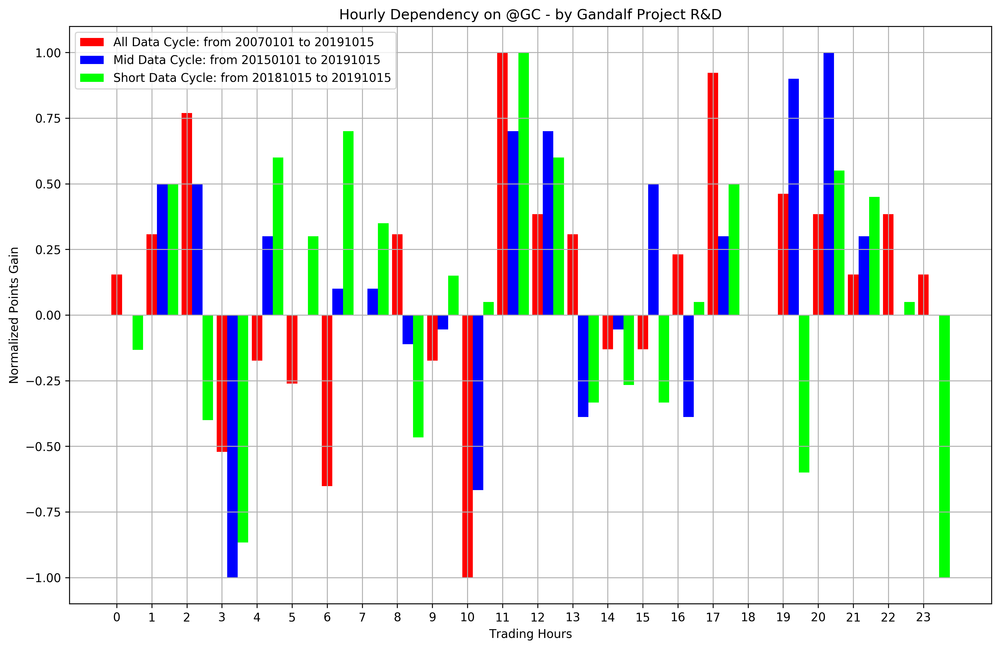

In [35]:
# MODULO GRAFICO **************************************
n_groups = 24
fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
index = np.arange(n_groups)
bar_width = 0.30
opacity = 1

label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

rects1 = plt.bar(index, 
                 hour_bias_long, 
                 bar_width,
                 alpha=opacity,
                 color='red',
                 label=label_all)
rects2 = plt.bar(index + bar_width, 
                 hour_bias_mid, 
                 bar_width,
                 alpha=opacity,
                 color='blue',
                 label=label_mid)
rects3 = plt.bar(index + 2 * bar_width, 
                 hour_bias_short, 
                 bar_width,
                 alpha=opacity,
                 color='lime',
                 label=label_short)

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Points Gain')
else:
    ax.set_ylabel('Points Gain')
ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

### Statistiche Profonde

In [36]:
def percPosNeg(array, soglia):
    """
    Funzione che restituisce le percentuali di valori 
    maggiori e minori di una soglia
    """
    if len(array) == 0:
        return 0,0
    contapos = 0
    contaneg = 0
    for el in array:
        if el > soglia:
            contapos+=1
        if el <= soglia:
            contaneg+=1
    return round(contapos/len(array)*100,2), round(contaneg/len(array)*100,2)

In [37]:
hours = []
for hour in range(0,24):
    hours.append(hour)
    
body_statistics_long = [] 
body_statistics_mid = [] 
body_statistics_short = [] 

for hour in hours:
    
    if instrument_Long[(instrument_Long.hour==hour)].body.count()!=0:
        if instrument_Long[(instrument_Long.hour==hour)].body.mean() > 0:
            body_statistics_long.append(
                round(percPosNeg(instrument_Long[(instrument_Long.hour==hour)]['body'],0)[0],2))
        if instrument_Long[(instrument_Long.hour==hour)]['body'].mean() <= 0:
            body_statistics_long.append(
                round(percPosNeg(instrument_Long[(instrument_Long.hour==hour)]['body'],0)[1],2))
    else:
        body_statistics_long.append(0)
        
    if instrument_Mid[(instrument_Mid.hour==hour)]['body'].count()!=0:
        if instrument_Mid[(instrument_Mid.hour==hour)]['body'].mean() > 0:
            body_statistics_mid.append(
                round(percPosNeg(instrument_Mid[(instrument_Mid.hour==hour)]['body'],0)[0],2))
        if instrument_Mid[(instrument_Mid.hour==hour)]['body'].mean() <= 0:
            body_statistics_mid.append(
                round(percPosNeg(instrument_Mid[(instrument_Mid.hour==hour)]['body'],0)[1],2))
    else:
        body_statistics_mid.append(0)

    if instrument_Short[(instrument_Short.hour==hour)]['body'].count()!=0:
        if instrument_Short[(instrument_Short.hour==hour)]['body'].mean() > 0:
            body_statistics_short.append(
                round(percPosNeg(instrument_Short[(instrument_Short.hour==hour)]['body'],0)[0],2))
        if instrument_Short[(instrument_Short.hour==hour)]['body'].mean() <= 0:
            body_statistics_short.append(
                round(percPosNeg(instrument_Short[(instrument_Short.hour==hour)]['body'],0)[1],2))
    else:
        body_statistics_short.append(0)

In [38]:
body_matrix = []
body_matrix.append(body_statistics_long)
body_matrix.append(body_statistics_mid)
body_matrix.append(body_statistics_short)
print(body_matrix)

[[47.84, 50.23, 52.7, 53.69, 52.29, 53.4, 53.57, 48.47, 49.91, 51.53, 52.54, 52.69, 49.51, 48.74, 50.69, 50.64, 49.7, 50.64, 0, 49.68, 48.83, 48.71, 50.14, 48.83], [46.11, 49.31, 50.41, 56.08, 49.47, 52.8, 48.78, 48.22, 51.46, 51.13, 50.97, 49.68, 50.08, 52.35, 51.95, 49.54, 52.63, 48.46, 0, 50.53, 50.36, 47.36, 48.99, 54.05], [52.33, 49.81, 53.1, 54.26, 52.14, 51.75, 48.84, 51.55, 51.55, 50.39, 51.55, 51.55, 49.61, 50.78, 53.17, 54.4, 51.2, 47.2, 0, 57.2, 49.03, 48.44, 49.61, 60.31]]


In [39]:
results_matrix = pd.DataFrame(body_matrix).transpose()
results_matrix.columns = ['Long','Mid','Short']
results_matrix = results_matrix[results_matrix>0].dropna()

In [40]:
results_matrix['ComboStats'] = round((3 * results_matrix['Long'] + 
                                      2 * results_matrix['Mid'] + 
                                      1 * results_matrix['Short'])/6,2)

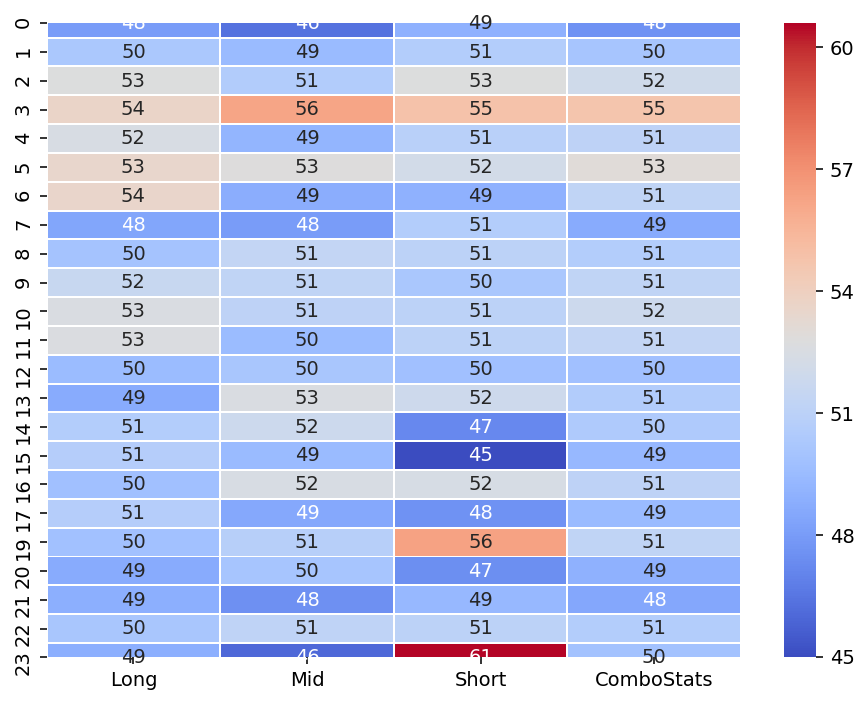

In [32]:
figure, ax = plt.subplots(figsize=(8, 6), dpi=140)
sns.heatmap(results_matrix, annot=True, linewidths=.5, ax=ax, cmap='coolwarm');

### Tendenza

In [41]:
trend = []
trend.append(hour_bias_long)
trend.append(hour_bias_mid)
trend.append(hour_bias_short)

In [42]:
trend_dataframe = pd.DataFrame(trend).transpose()
trend_dataframe.columns = ['Long','Mid','Short']
trend_dataframe["LongTrend"] = trend_dataframe.Long.cumsum()
trend_dataframe["MidTrend"] = trend_dataframe.Mid.cumsum()
trend_dataframe["ShortTrend"] = trend_dataframe.Short.cumsum()

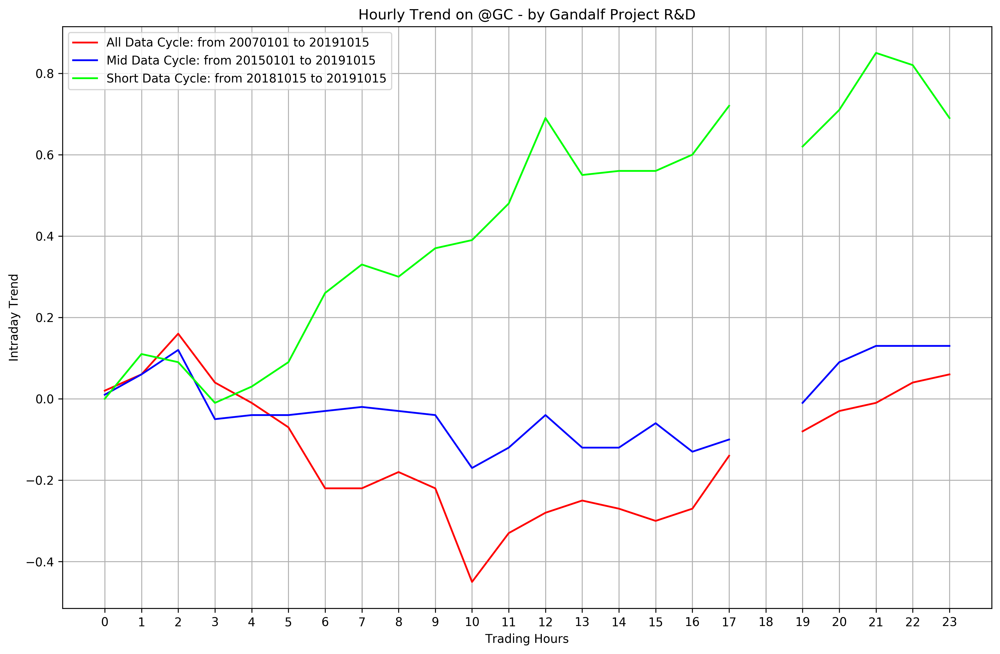

In [51]:
def plot_line(long,mid,short):
    n_groups = 24
    fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
    index = np.arange(n_groups)
    bar_width = 0.30
    opacity = 1

    label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
    label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
    label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

    rects1 = plt.plot(long, color='red', label=label_all)
    rects2 = plt.plot(mid, color='blue', label=label_mid)
    rects3 = plt.plot(short, color='lime', label=label_short)

    ax.set_xlabel('Trading Hours')
    if normalize == True:
        ax.set_ylabel('Normalized Intraday Trend')
    else:
        ax.set_ylabel('Intraday Trend')
    ax.set_title('Hourly Trend on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
    ax.set_xticks(index)
    ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                         '13','14','15','16','17','18','19','20','21','22','23']))
    ax.legend()
    ax.grid(True)
    plt.show()
    return

plot_line(trend_dataframe.LongTrend,
          trend_dataframe.MidTrend,
          trend_dataframe.ShortTrend)

### Day of week

In [1]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

def load_data(filename):
    """
    Funzione per il parsing di una serie intraday 
    con estensione txt esportata da Tradestation
    """
    data = pd.read_csv(filename, 
                       usecols=['Date','Time','Open','High','Low','Close','Up','Down'], 
                       parse_dates=[['Date', 'Time']], )
    data.columns = ["date_time","open","high","low","close","up","down"]
    data.set_index('date_time', inplace = True)
    data['volume'] = data['up'] + data['down']
    data.drop(['up','down'], axis=1, inplace=True)
    return data

def normalizeMaxMin(array):
    """
    Funzione per normalizzare un array
    che porta ad 1 il valore massimo
    a[i]/max(a) e a -1 il valore minimo a[i]/min(a)
    Funzione che lascia lo zero invariato!
    """
    normalized_array = []
    for element in array:
        if element > 0:
            normalized_array.append(element / max(array))
        else:
            normalized_array.append(-element / min(array))
    return normalized_array

In [13]:
#******* INPUT *********************************

filename = "@GC_60min_Exchange.txt"

startDateLong = "20070101"
endDateLong = "20191015"

startDateMid = "20150101"
endDateMid = "20191015"

startDateShort = "20181015"
endDateShort = "20191015"

normalize = False

#******* INPUT *********************************

In [14]:
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset['dayofweek'] = dataset.index.dayofweek
dataset['body'] = round((dataset.close - dataset.open),2)
dataset.tail(23)

,open,high,low,close,volume,hour,dayofweek,body
date_time,,,,,,,,
2019-09-12 19:00:00,1506.5,1507.2,1502.9,1504.6,3620,19,3,-1.9
2019-09-12 20:00:00,1504.5,1506.0,1503.4,1505.4,2976,20,3,0.9
2019-09-12 21:00:00,1505.4,1508.6,1504.3,1506.1,8114,21,3,0.7
2019-09-12 22:00:00,1506.1,1506.4,1503.1,1504.4,5637,22,3,-1.7
2019-09-12 23:00:00,1504.4,1505.6,1503.6,1504.2,3244,23,3,-0.2
2019-09-13 00:00:00,1504.2,1505.3,1503.8,1505.1,2122,0,4,0.9
2019-09-13 01:00:00,1505.1,1506.4,1505.0,1505.4,2267,1,4,0.3
2019-09-13 02:00:00,1505.4,1505.5,1504.2,1505.1,2362,2,4,-0.3
2019-09-13 03:00:00,1505.0,1513.5,1504.9,1512.5,14072,3,4,7.5


In [15]:
dow = {"Monday": 0, "Tuesday":1, "Wednesday":2, "Thursday":3, "Friday":4, "Sunday":6}
dow

{'Monday': 0,
 'Tuesday': 1,
 'Wednesday': 2,
 'Thursday': 3,
 'Friday': 4,
 'Sunday': 6}

In [16]:
def plot_hist(long,mid,short,dow):
    n_groups = 24
    fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
    index = np.arange(n_groups)
    bar_width = 0.30
    opacity = 1

    label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
    label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
    label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

    rects1 = plt.bar(index, long, 
                     bar_width, alpha=opacity, color='red',
                     label=label_all)
    rects2 = plt.bar(index + bar_width, mid, 
                     bar_width, alpha=opacity, color='blue',
                     label=label_mid)
    rects3 = plt.bar(index + 2 * bar_width, short, 
                     bar_width, alpha=opacity, color='lime',
                     label=label_short)

    ax.set_xlabel('Trading Hours')
    if normalize == True:
        ax.set_ylabel('Normalized Points Gain')
    else:
        ax.set_ylabel('Points Gain')
    ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' on ' + dow + ' - by Gandalf Project R&D')
    ax.set_xticks(index)
    ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                         '13','14','15','16','17','18','19','20','21','22','23']))
    ax.legend()
    ax.grid(True)
    plt.show()
    return

In [17]:
def plot_line(long,mid,short,dow):
    n_groups = 24
    fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
    index = np.arange(n_groups)
    bar_width = 0.30
    opacity = 1

    label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
    label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
    label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

    rects1 = plt.plot(long, color='red', label=label_all)
    rects2 = plt.plot(mid, color='blue', label=label_mid)
    rects3 = plt.plot(short, color='lime', label=label_short)

    ax.set_xlabel('Trading Hours')
    if normalize == True:
        ax.set_ylabel('Normalized Intraday Trend')
    else:
        ax.set_ylabel('Intraday Trend')
    ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' on ' + dow + ' - by Gandalf Project R&D')
    ax.set_xticks(index)
    ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                         '13','14','15','16','17','18','19','20','21','22','23']))
    ax.legend()
    ax.grid(True)
    plt.show()
    return

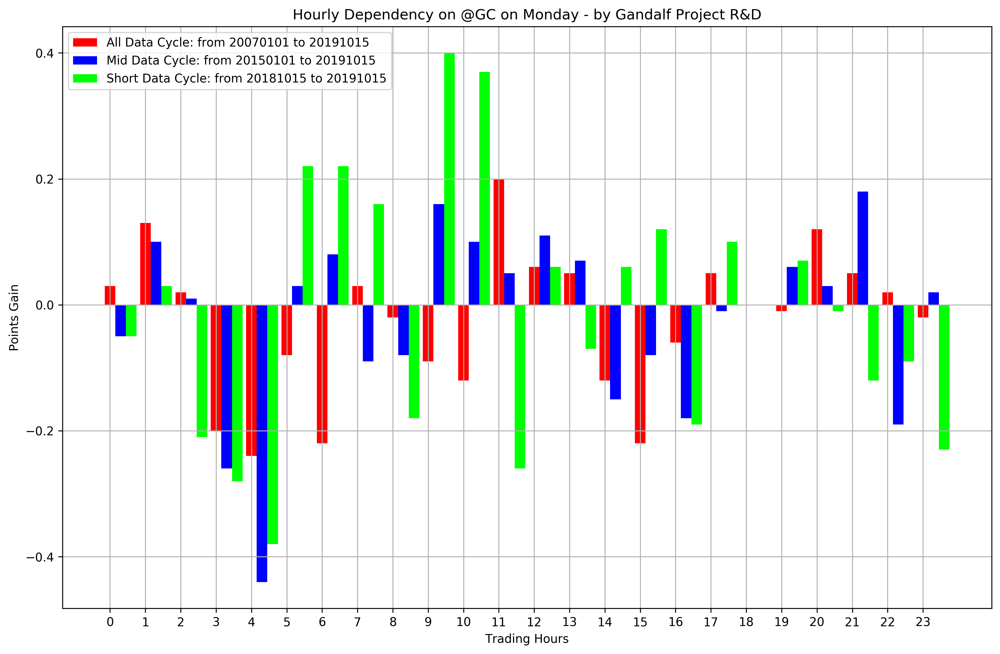

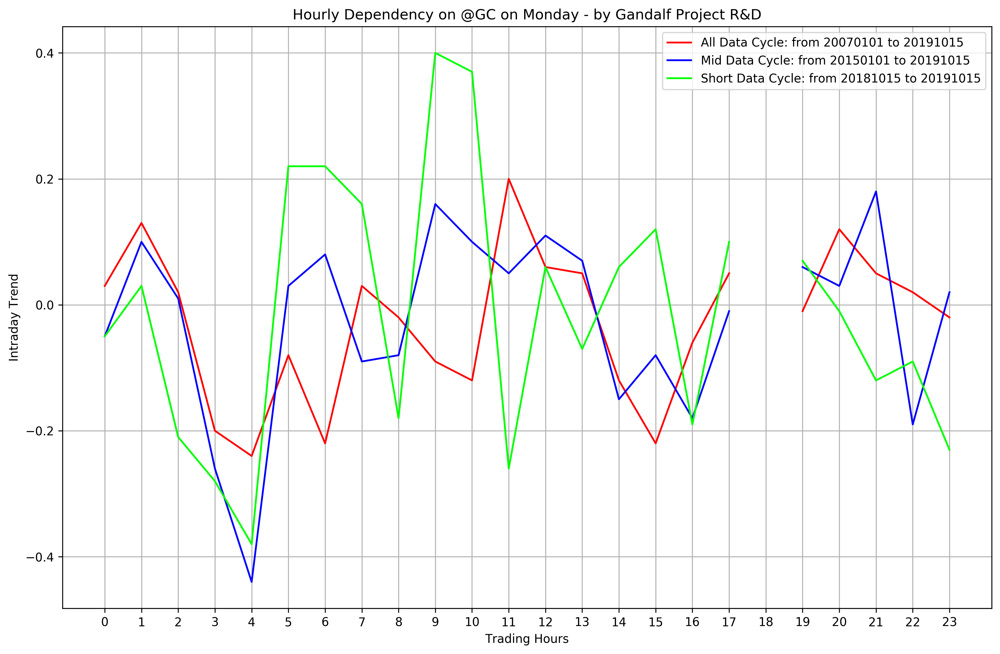

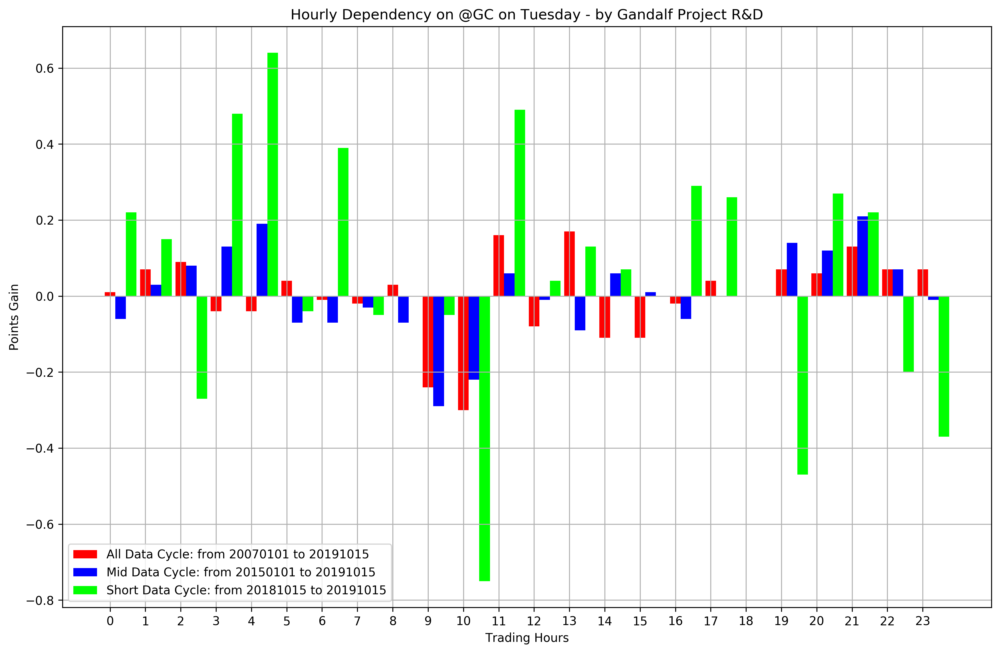

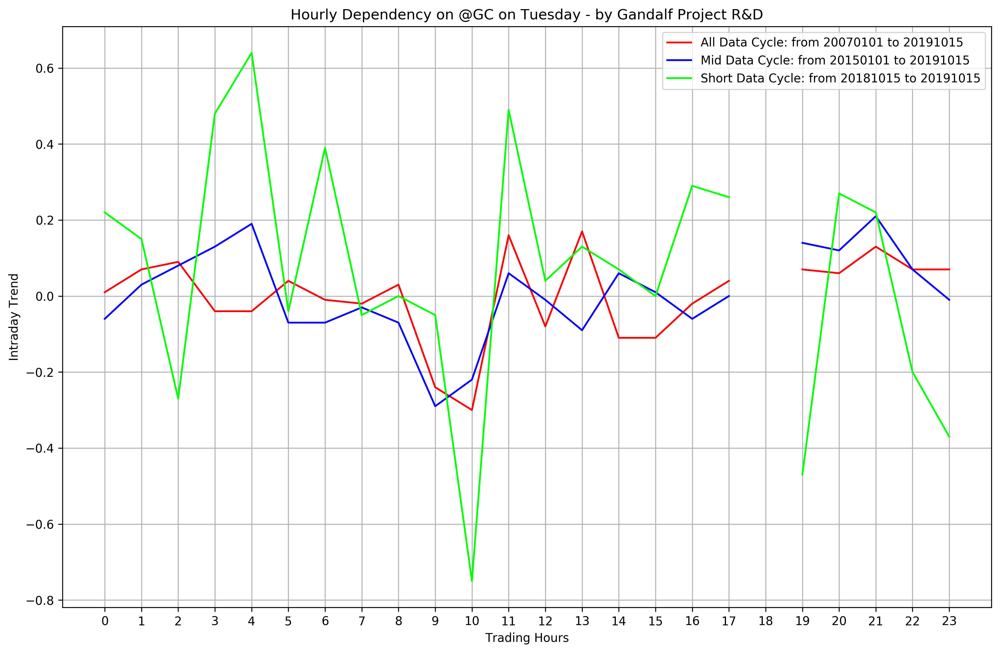

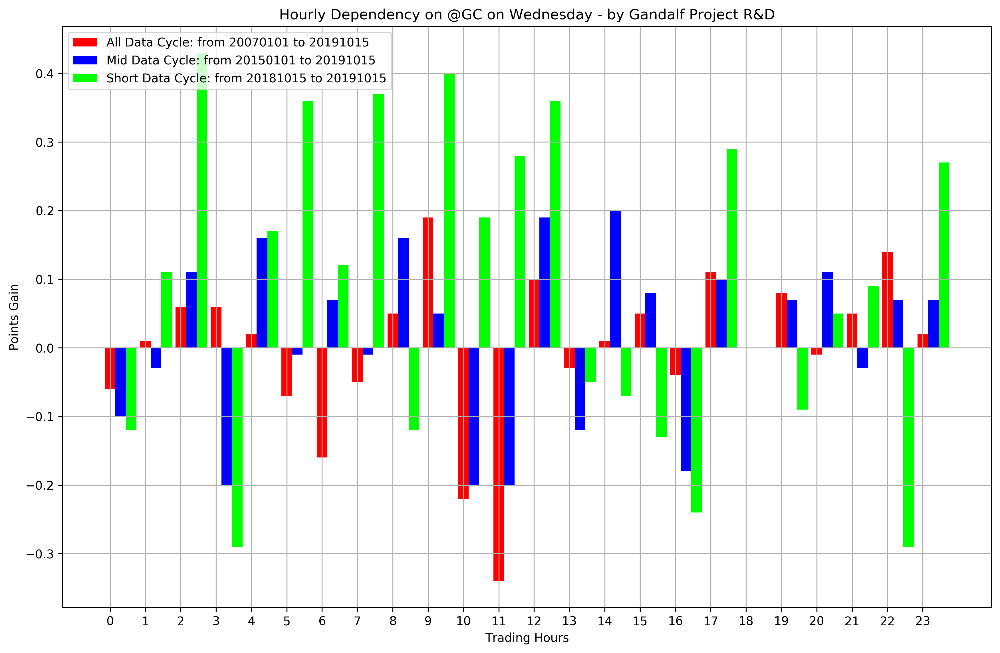

...

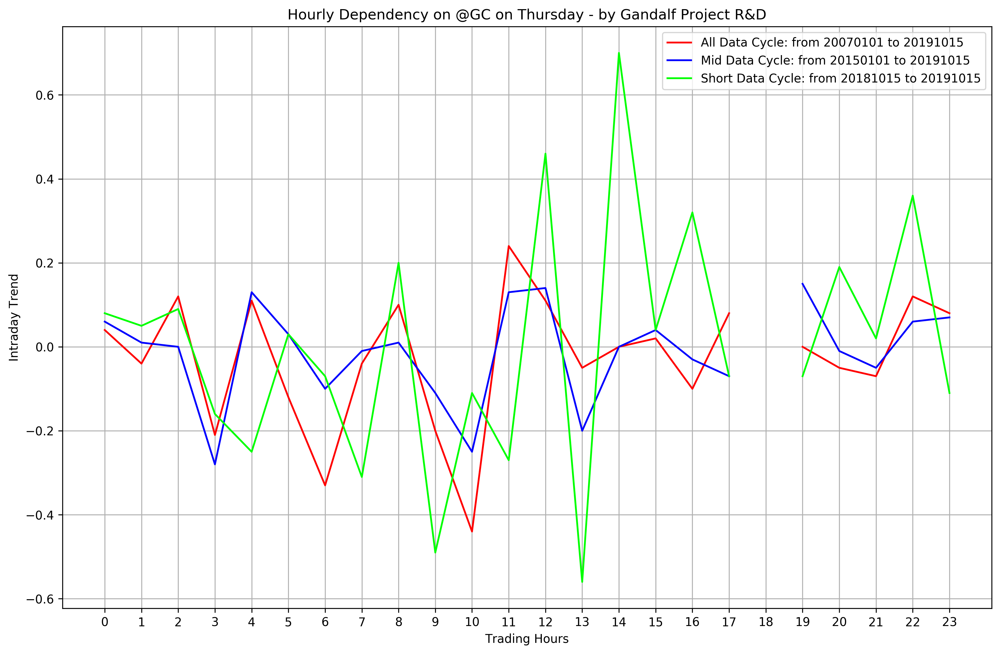

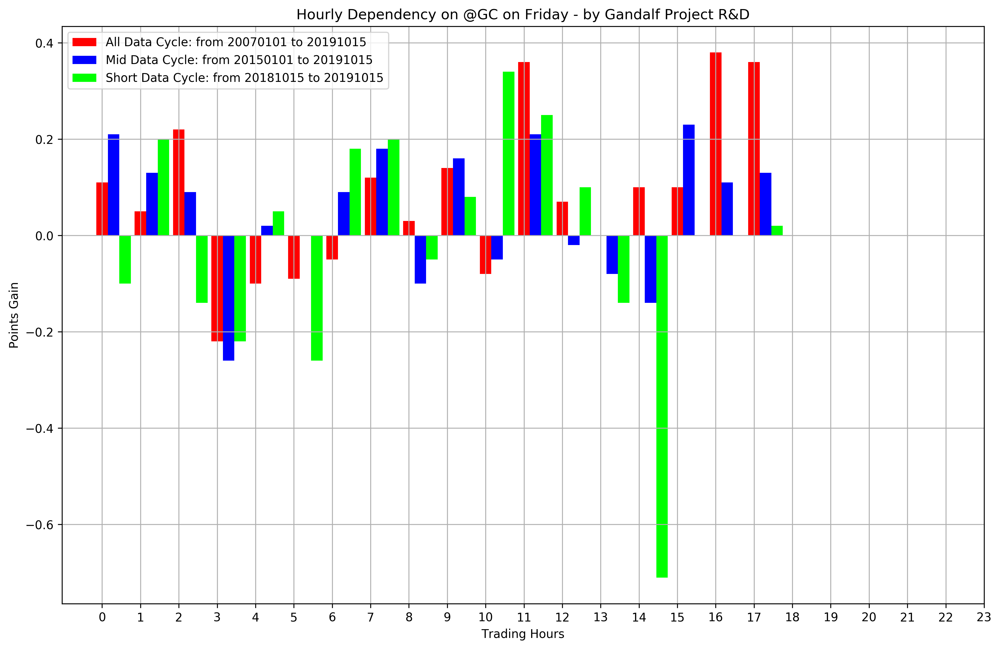

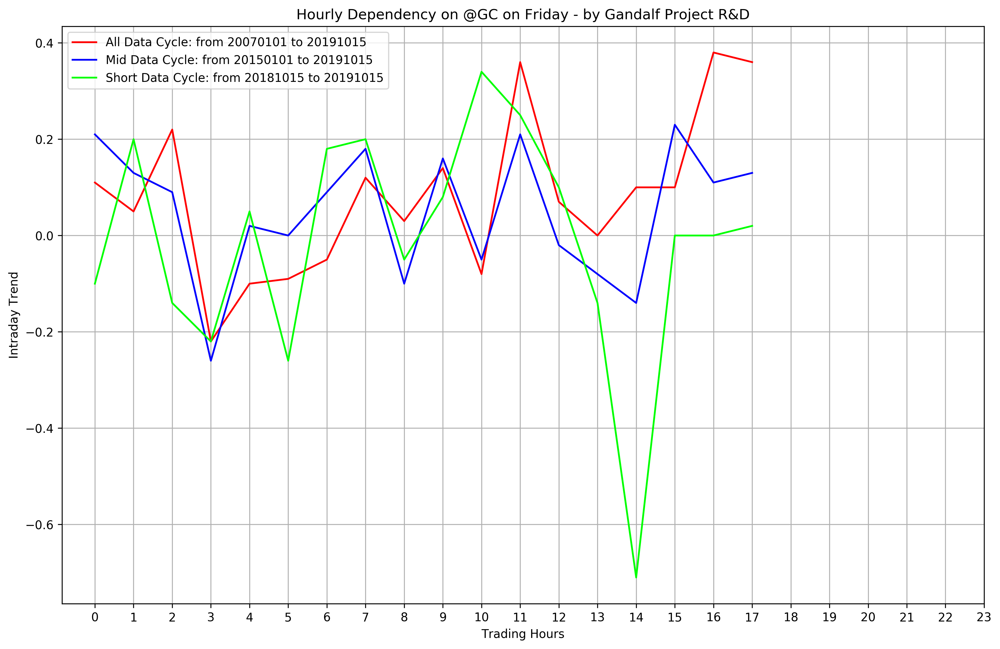

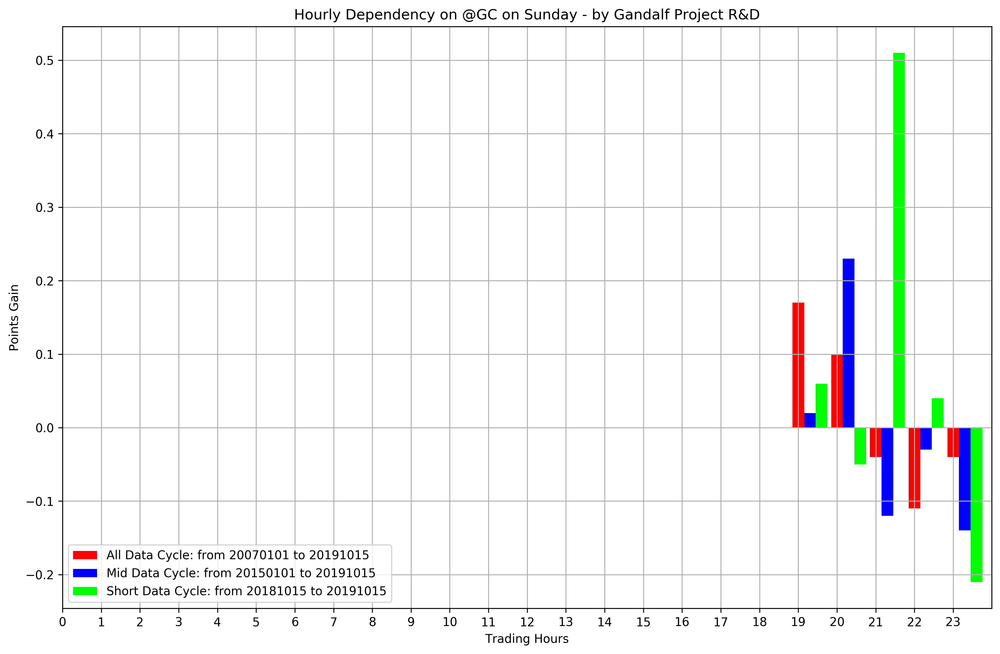

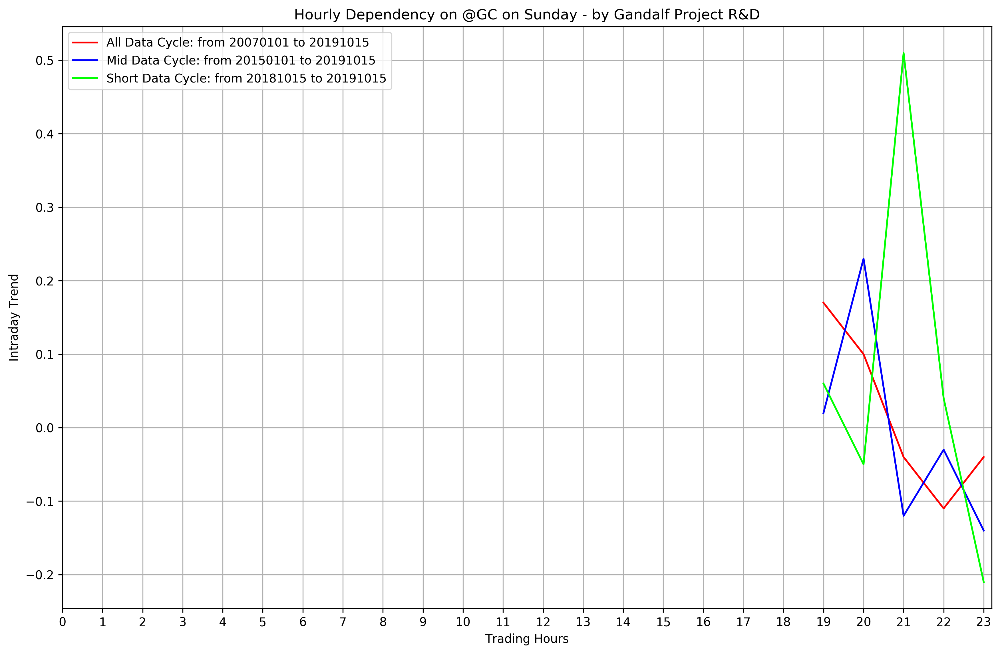

In [18]:
startDateLongParsed = datetime.date(int(startDateLong[0:4]), int(startDateLong[4:6]), int(startDateLong[6:]))
endDateLongParsed = datetime.date(int(endDateLong[0:4]), int(endDateLong[4:6]), int(endDateLong[6:]))

startDateMidParsed = datetime.date(int(startDateMid[0:4]), int(startDateMid[4:6]), int(startDateMid[6:]))
endDateMidParsed = datetime.date(int(endDateMid[0:4]), int(endDateMid[4:6]), int(endDateMid[6:]))

startDateShortParsed = datetime.date(int(startDateShort[0:4]), int(startDateShort[4:6]), int(startDateShort[6:]))
endDateShortParsed = datetime.date(int(endDateShort[0:4]), int(endDateShort[4:6]), int(endDateShort[6:]))

instrument_Long = dataset.loc[startDateLongParsed:endDateLongParsed]
instrument_Mid = dataset.loc[startDateMidParsed:endDateMidParsed]
instrument_Short = dataset.loc[startDateShortParsed:endDateShortParsed]

for key, value in dow.items():
    
    hour_bias_long = []
    hour_bias_mid = []
    hour_bias_short = []

    hours = []
    for hour in range(0,24):
        hours.append(hour)

    for hour in hours:
        hour_bias_long.append(round(instrument_Long[(instrument_Long.hour == hour) & 
                                                    (instrument_Long.dayofweek == value)].body.mean(),2))
        hour_bias_mid.append(round(instrument_Mid[(instrument_Mid.hour == hour) & 
                                                  (instrument_Mid.dayofweek == value)].body.mean(),2))
        hour_bias_short.append(round(instrument_Short[(instrument_Short.hour == hour) & 
                                                      (instrument_Short.dayofweek == value)].body.mean(),2))

    if normalize == True:
        hour_bias_long = normalizeMaxMin(hour_bias_long)
        hour_bias_mid = normalizeMaxMin(hour_bias_mid)
        hour_bias_short = normalizeMaxMin(hour_bias_short)
        
    plot_hist(hour_bias_long,hour_bias_mid,hour_bias_short,key)
    plot_line(hour_bias_long,hour_bias_mid,hour_bias_short,key)